In [3]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq

%load_ext autoreload
%autoreload 2

/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/spatialdata/__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


In [4]:
adata = sc.datasets.visium_sge('V1_Breast_Cancer_Block_A_Section_1')
adata.var_names_make_unique()

/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Here we do the usual preprocessing in singe cell
- remove low counts
- remove low expressed genes (We use sctm functio which just cuts off by percentage instead of exact number)
- find variable features (Personally, I found that a higher number of variable genes work better)

In [5]:
sc.pp.filter_cells(adata, min_genes=50)
sctm.pp.filter_genes(adata, 0.03,  expression_cutoff_99q = 1)
sc.pp.highly_variable_genes(adata, n_top_genes=6000, flavor="seurat_v3")

We build the graph in using squidpy's default function (Default option is the ring around each spot)

In [6]:
sq.gr.spatial_neighbors(adata)

In [7]:
n_topics = 20

In [8]:
# Only hvgs and fit a total of 20 topics
model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics = n_topics,
)

# uses gpu by default to use cpu use device="cpu"
model.train()

Computing background frequencies


  0%|                                                                                                                                     | 0/800 [00:00<?, ?it/s]/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/pyro/primitives.py:443: UserWarning: encoder.norm_topic.0.weight was not registered in the param store because requires_grad=False. You can silence this warning by calling my_module.train(False)
  warnings.warn(
Epoch Loss:6209.605:  19%|██████████████████▉                                                                                   | 149/800 [05:22<23:31,  2.17s/it]

Early Stopping


In [11]:
# Get topic prop which is the latent representation and beta which are the gene modules
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()
# Add it into adata to visualize
for i in topic_prop.columns:
    adata.obs[i] = topic_prop[i]

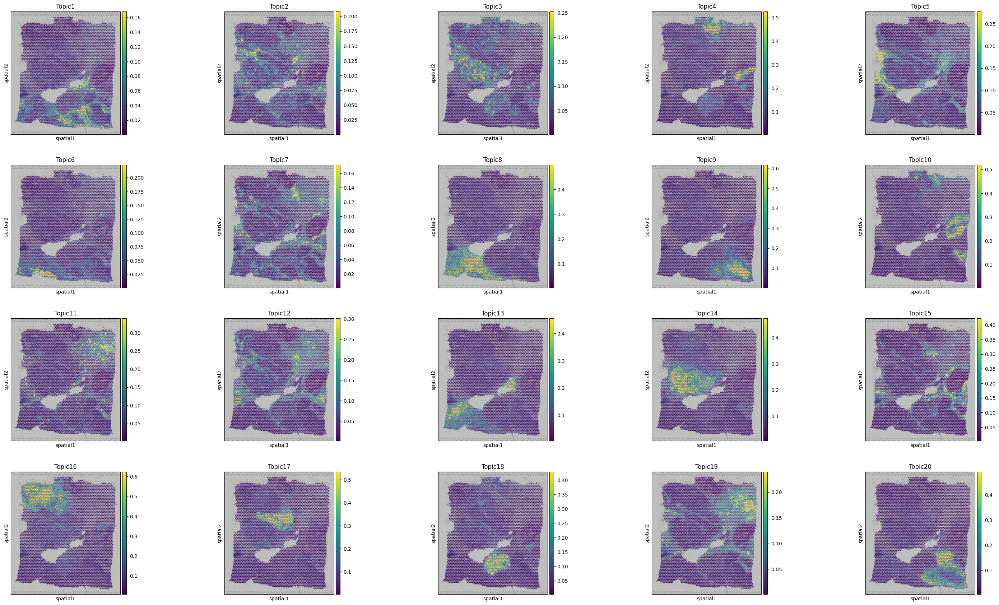

In [12]:
sc.pl.spatial(adata, color = topic_prop.columns, ncols = 5, vmax ='p99')

In [13]:
top_genes = []
for i in topic_prop.columns:
    top_genes += beta.nlargest(1, i).index.tolist()

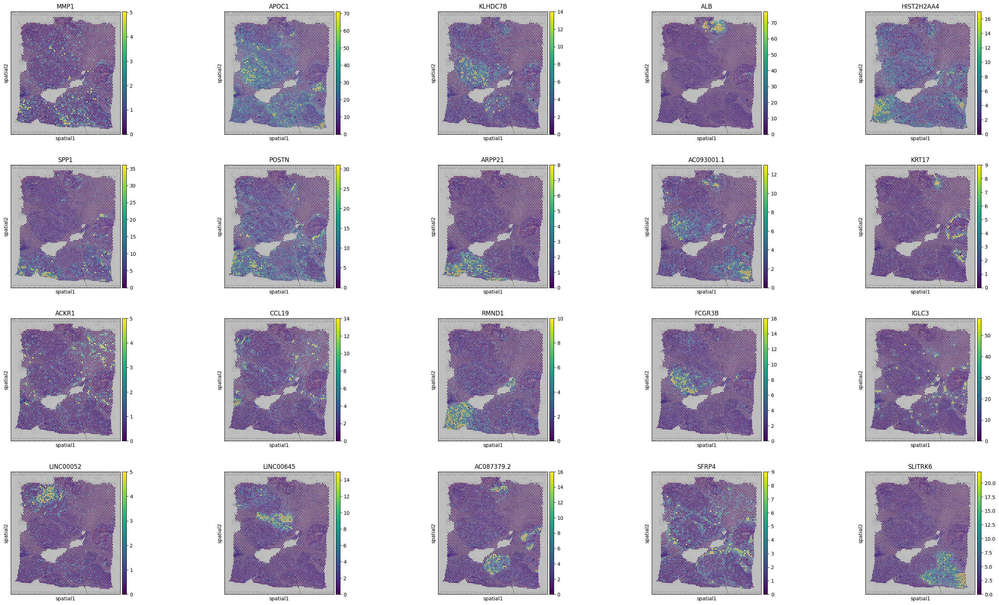

In [14]:
sc.pl.spatial(adata, color = top_genes, vmax = 'p99', ncols = 5)

Additional plotting function(taken and editted from cell2location). On a Visium dataset, it is kinda of a marker-free deconvolution. 

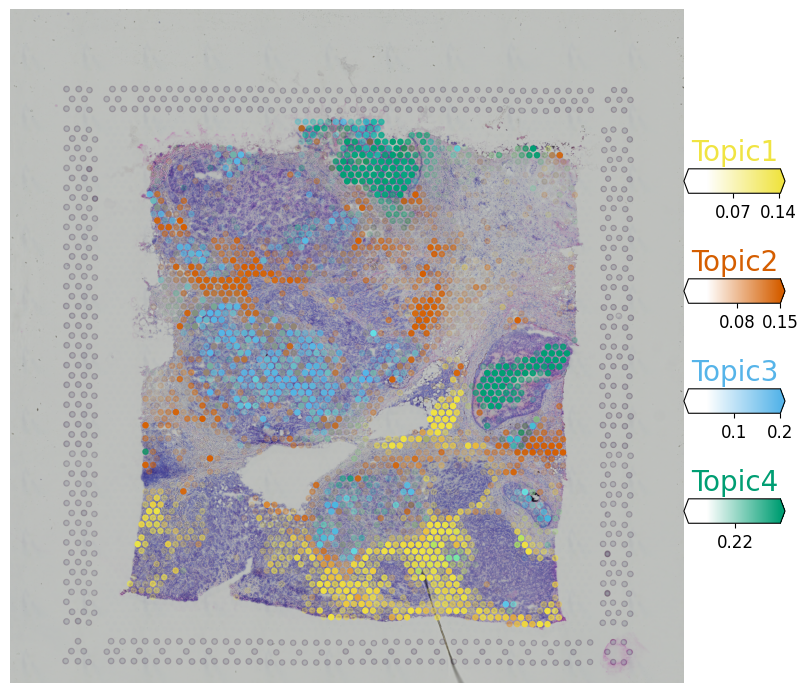

In [15]:
fig = sctm.pl.plot_spatial(adata, topic_prop.loc[:, ["Topic1", "Topic2", "Topic3", "Topic4"]])

In [ ]:
sctm.analysis.get_enrichr_geneset()

Over-enrichment analysis.
We provide a convenice function 

In [35]:
# Annotate with DISCOtoolkit_py
#!pip install discotoolkit
disco_results = sctm.analysis.get_topic_enrichr(beta, geneset = "KEGG_2019_Human")

In [37]:
disco_results['Topic10']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Human,Estrogen signaling pathway,4/137,0.000009,0.000103,0,0,37.306391,431.915099,KRT17;KRT15;KRT14;TFF1
1,KEGG_2019_Human,IL-17 signaling pathway,3/93,0.000105,0.000576,0,0,39.000000,357.384969,S100A9;S100A8;S100A7
2,KEGG_2019_Human,African trypanosomiasis,2/37,0.000620,0.002272,0,0,63.317460,467.693511,HBB;HBA2
3,KEGG_2019_Human,Malaria,2/49,0.001086,0.002987,0,0,47.122931,321.618214,HBB;HBA2
4,KEGG_2019_Human,Nicotine addiction,1/40,0.039267,0.086388,0,0,26.910931,87.120572,GABRP
5,KEGG_2019_Human,GABAergic synapse,1/89,0.085375,0.137046,0,0,11.897129,29.275335,GABRP
6,KEGG_2019_Human,Morphine addiction,1/91,0.087211,0.137046,0,0,11.631579,28.374333,GABRP
7,KEGG_2019_Human,Retrograde endocannabinoid signaling,1/148,0.138104,0.179361,0,0,7.100967,14.058122,GABRP
8,KEGG_2019_Human,Wnt signaling pathway,1/158,0.146750,0.179361,0,0,6.645323,12.752542,MMP7
9,KEGG_2019_Human,Human T-cell leukemia virus 1 infection,1/219,0.197732,0.217505,0,0,4.771125,7.733243,MMP7
